# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [42]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [43]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [44]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [45]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [46]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [47]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [48]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)
    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE #### 
    penalty = (torch.mean(gradient_norm) - 1)**2
    #### END CODE HERE ####
    return penalty

In [49]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [50]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = -torch.mean(crit_fake_pred)
    return gen_loss

In [51]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [52]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred)  + c_lambda*gp
    return crit_loss

In [53]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.007281195451505482, critic loss: 0.594040922190994


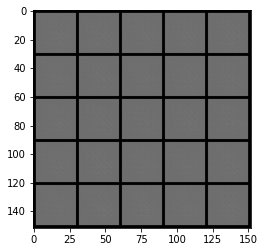

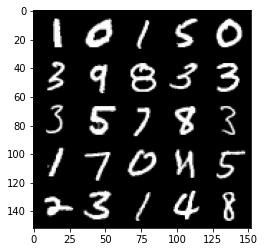

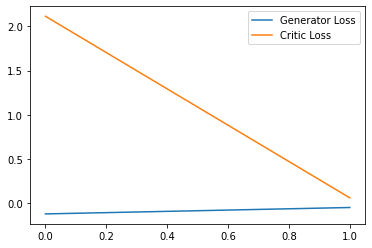

Step 100: Generator loss: 1.547783505152911, critic loss: -3.3994704276323313


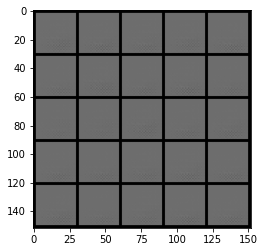

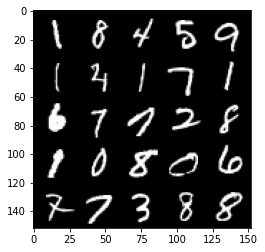

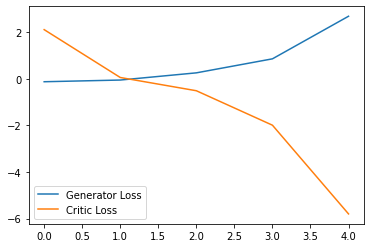

Step 150: Generator loss: 3.021557366847992, critic loss: -14.740811145782468


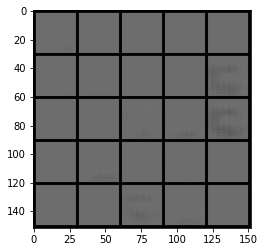

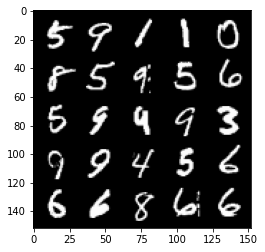

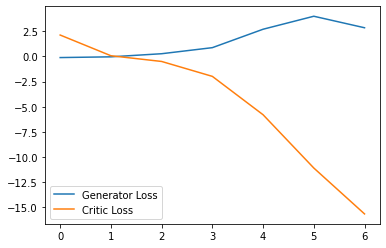

Step 200: Generator loss: 1.189752788245678, critic loss: -32.00617483520509


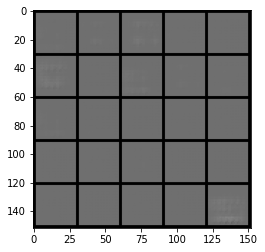

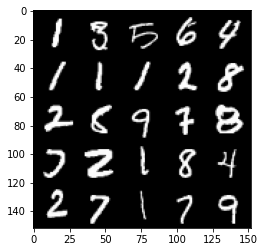

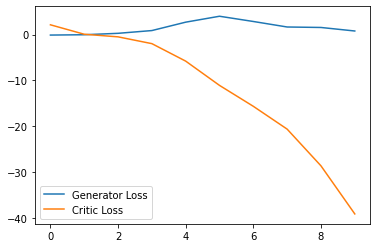

Step 250: Generator loss: -0.29310761839151384, critic loss: -62.04781111145017


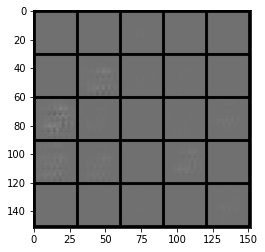

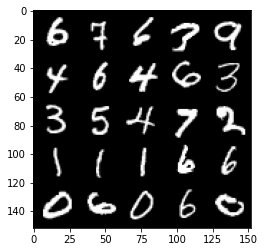

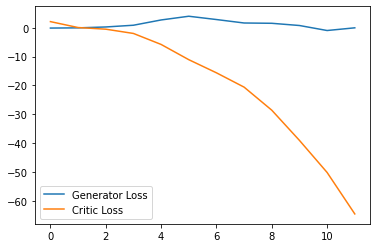

Step 300: Generator loss: 0.2581793609261513, critic loss: -103.05435055541997


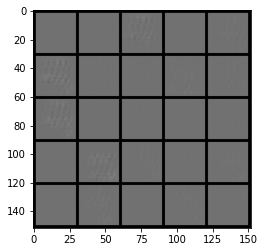

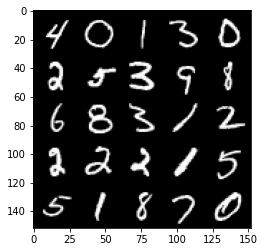

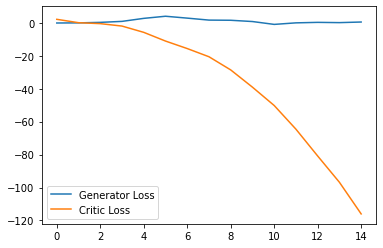

Step 350: Generator loss: 1.3805394190549851, critic loss: -153.02297640991213


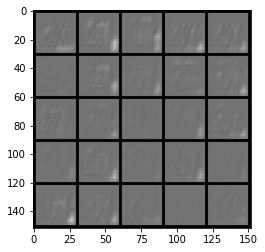

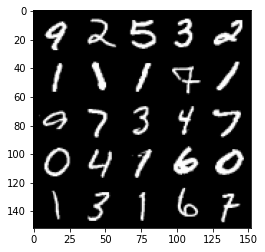

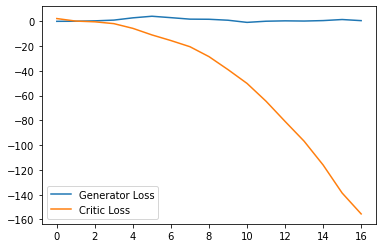

Step 400: Generator loss: 7.498533716201782, critic loss: -212.8842054443359


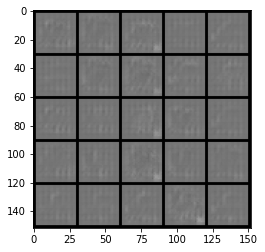

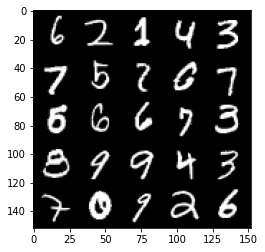

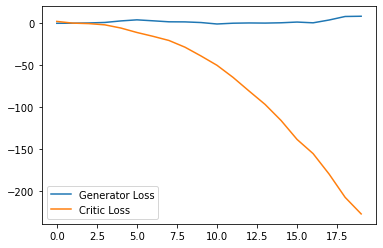

Step 450: Generator loss: 12.696259565353394, critic loss: -270.78535058593746


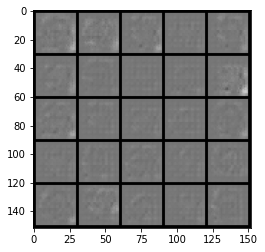

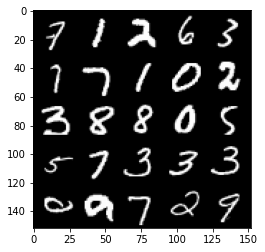

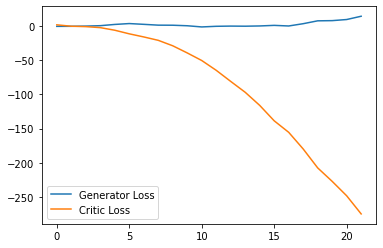

Step 500: Generator loss: 10.974108328819275, critic loss: -310.98884893798817


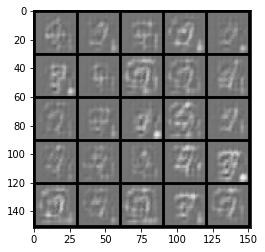

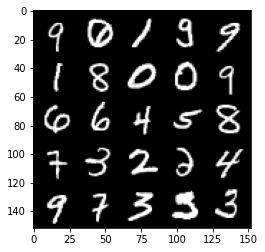

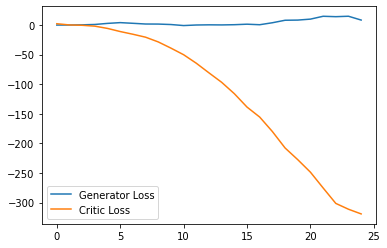

Step 550: Generator loss: -9.370369575023652, critic loss: -305.76849258422857


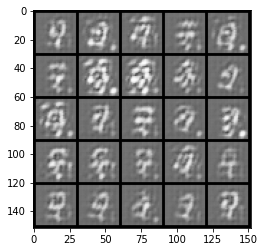

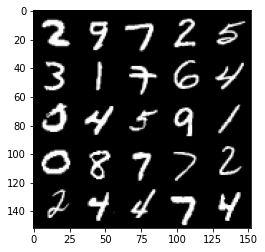

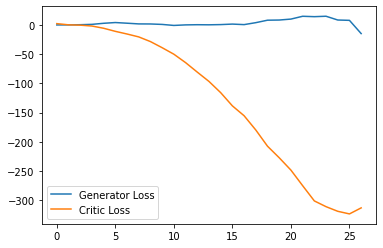

Step 600: Generator loss: -28.969008617401123, critic loss: -267.93293359375


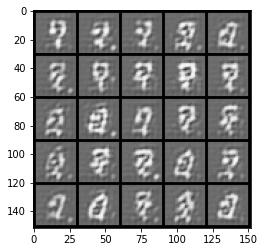

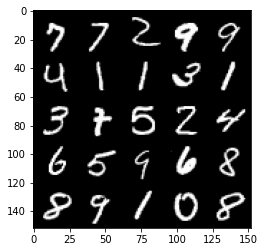

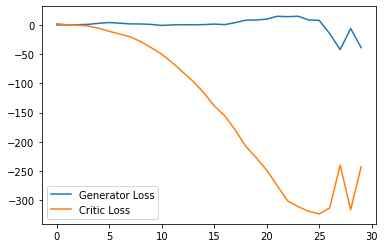

Step 650: Generator loss: 14.783202428817749, critic loss: -351.48747311401377


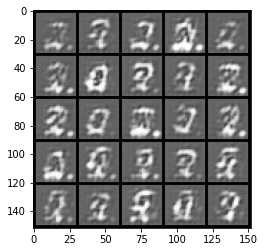

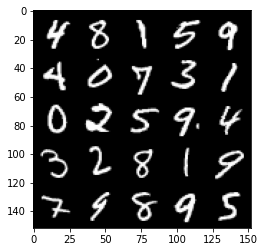

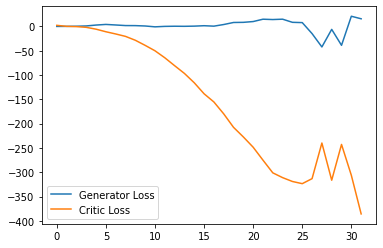

Step 700: Generator loss: -22.656064928770064, critic loss: -291.1595487518311


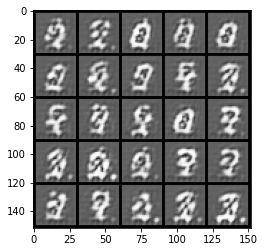

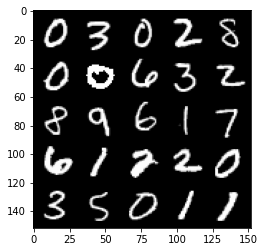

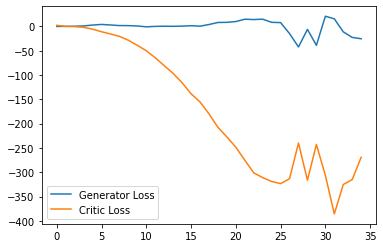

Step 750: Generator loss: -17.29625967979431, critic loss: -298.83902105712895


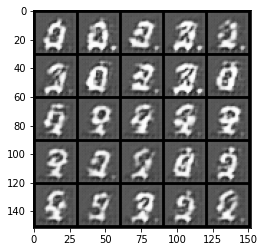

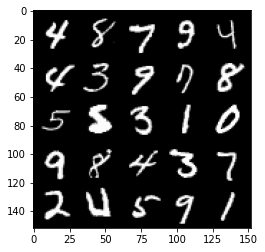

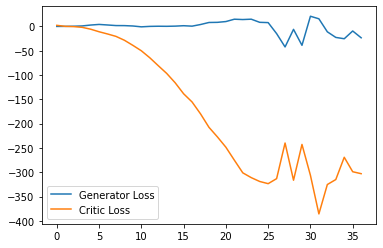

Step 800: Generator loss: -57.657007987499235, critic loss: -249.485314086914


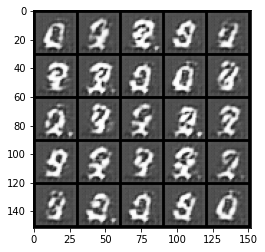

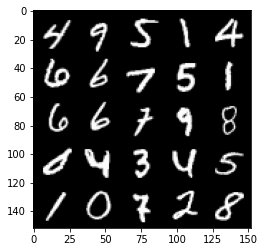

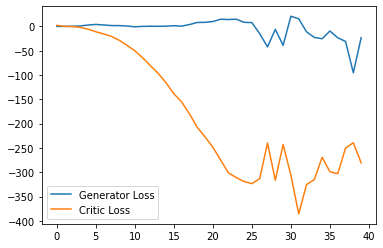

Step 850: Generator loss: -44.929234704971314, critic loss: -197.33297050476074


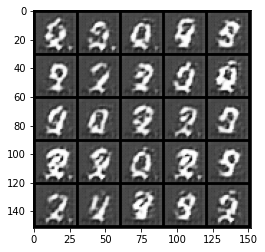

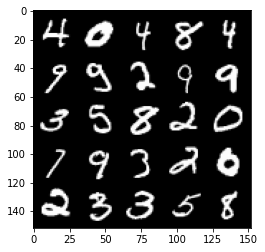

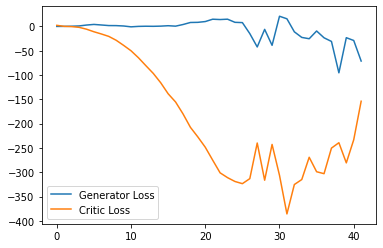

Step 900: Generator loss: -44.861569519042966, critic loss: -121.52011393737801


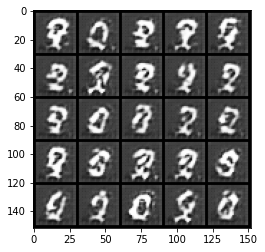

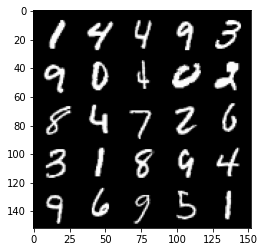

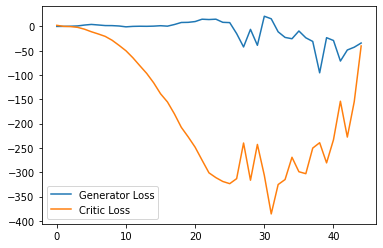

Step 950: Generator loss: -72.99530477046966, critic loss: -146.58792361450193


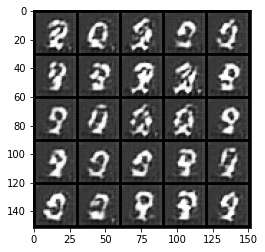

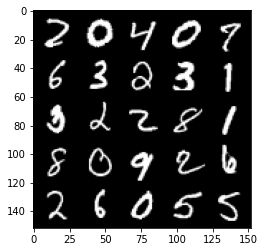

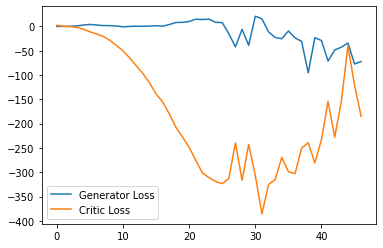

Step 1000: Generator loss: -68.86219562530518, critic loss: -56.22682350158692


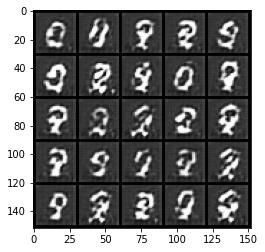

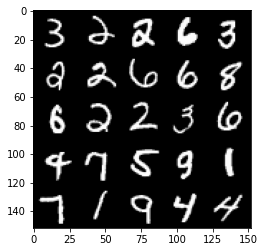

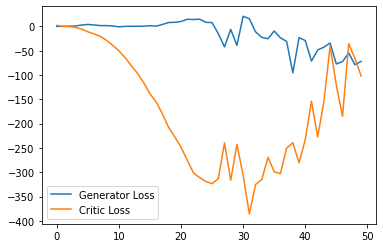

Step 1050: Generator loss: -37.5627811050415, critic loss: 19.43458407592773


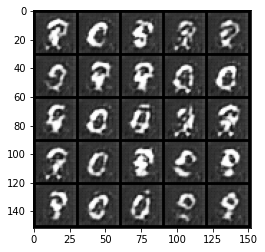

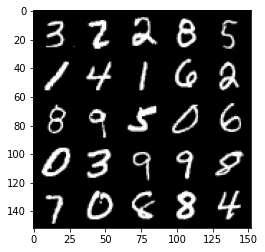

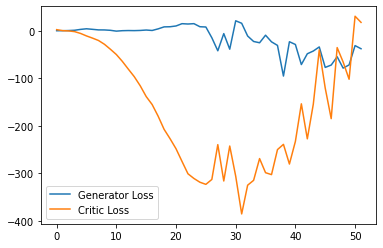

Step 1100: Generator loss: -68.5789123916626, critic loss: -42.35588758087159


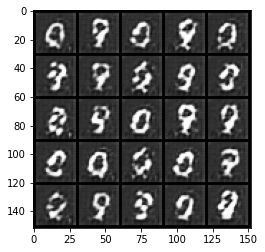

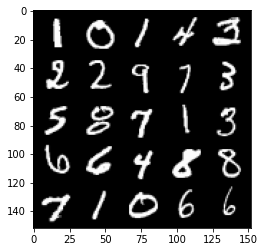

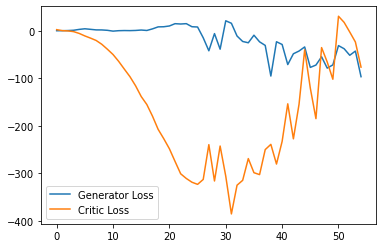

Step 1150: Generator loss: -63.644939389228824, critic loss: -14.90358930206299


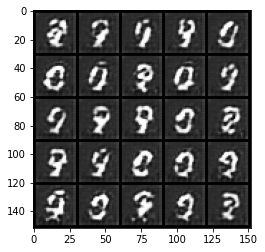

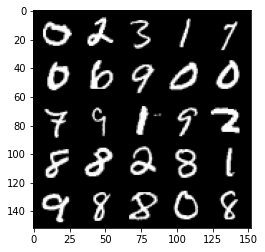

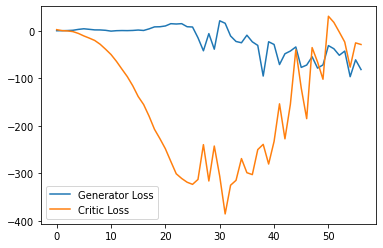

Step 1200: Generator loss: -38.538758544921876, critic loss: 19.288047275543214


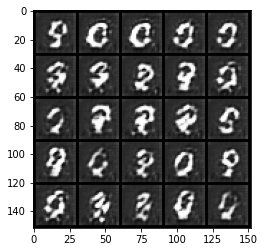

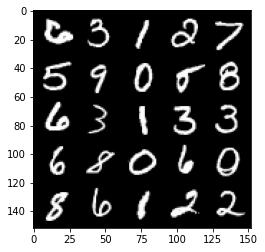

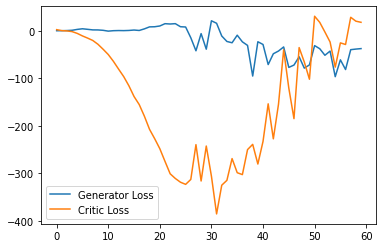

Step 1250: Generator loss: -37.47512336730957, critic loss: 13.143081874847413


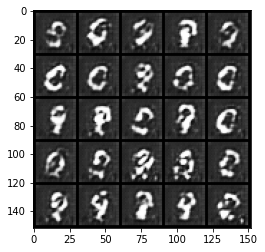

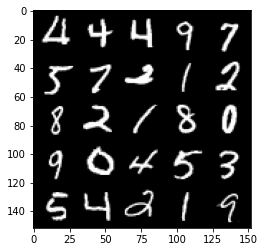

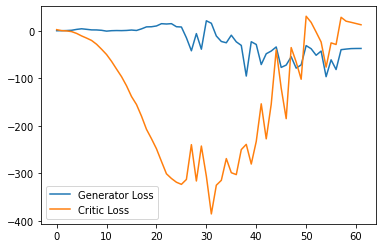

Step 1300: Generator loss: -37.82028648376465, critic loss: 10.672493793487549


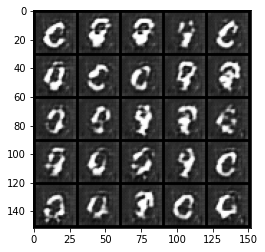

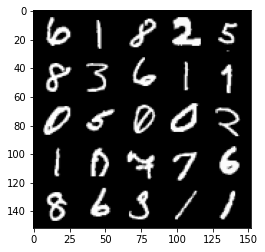

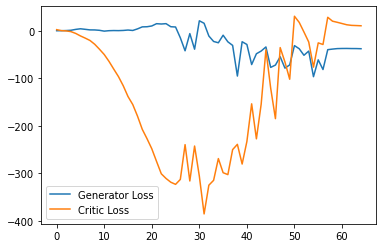

Step 1350: Generator loss: -38.66833518981934, critic loss: 11.723063781738281


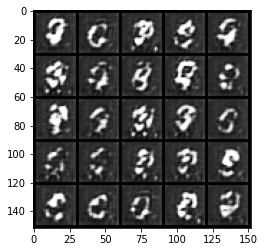

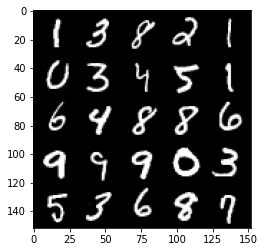

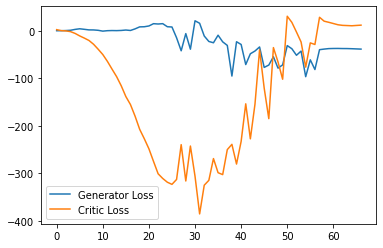

Step 1400: Generator loss: -39.81163345336914, critic loss: 13.79701615142822


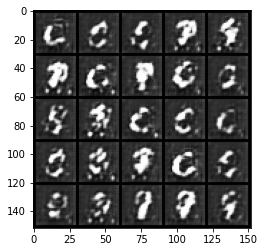

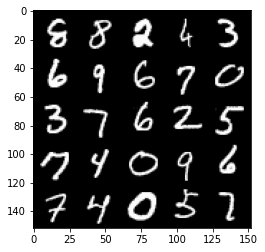

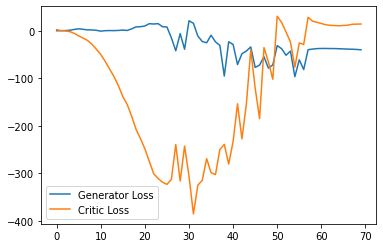

Step 1450: Generator loss: -41.418466873168946, critic loss: 12.324207824707033


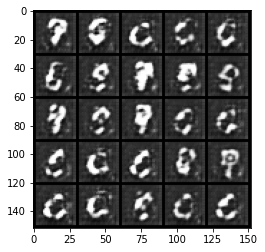

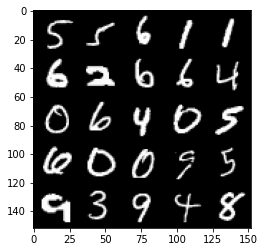

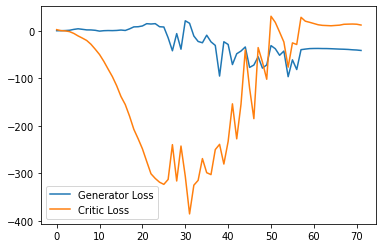

Step 1500: Generator loss: -43.51160972595215, critic loss: 8.056314098358154


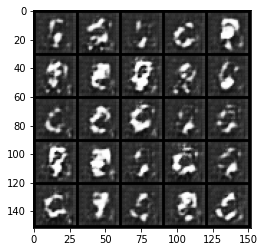

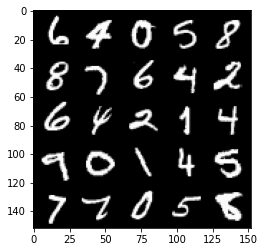

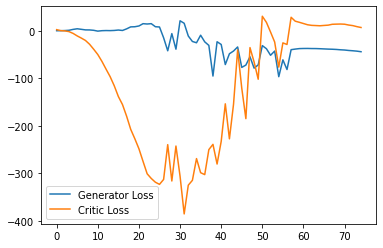

Step 1550: Generator loss: -46.033652725219724, critic loss: 4.331683582305908


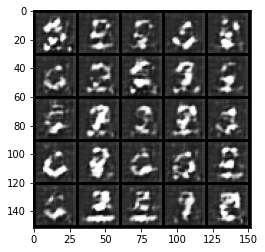

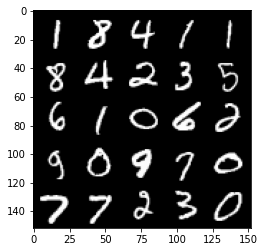

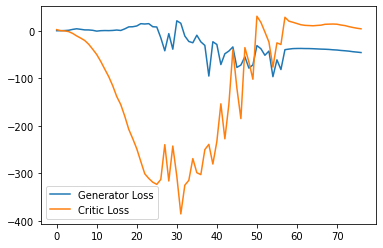

Step 1600: Generator loss: -51.25860015869141, critic loss: 3.4455859336853023


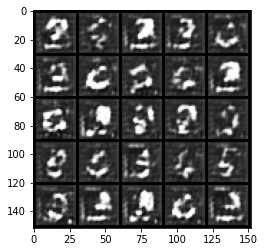

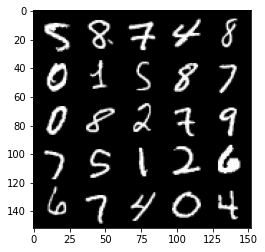

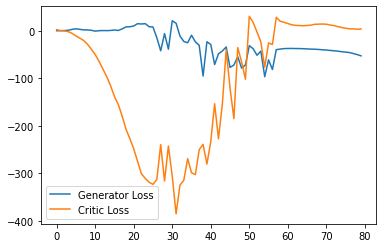

Step 1650: Generator loss: -58.513934478759765, critic loss: 3.31979688835144


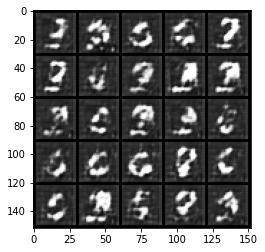

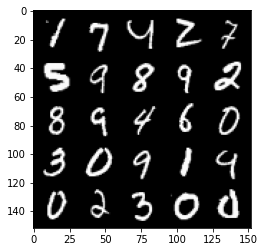

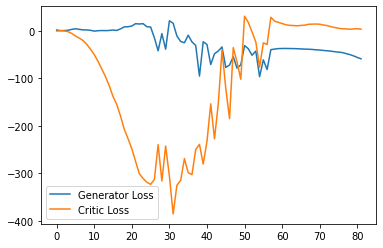

Step 1700: Generator loss: -62.571087951660154, critic loss: 0.2923461608886718


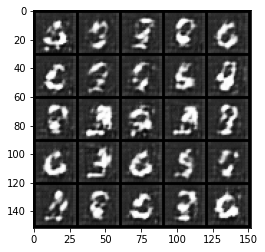

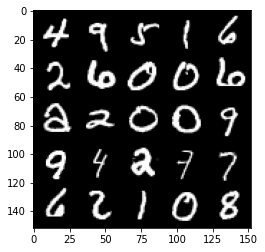

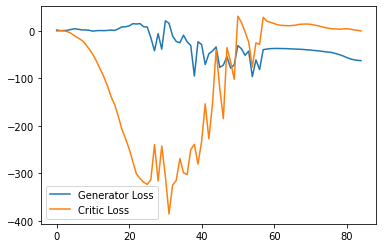

Step 1750: Generator loss: -63.42599761962891, critic loss: -2.785799462318421


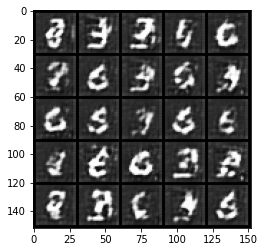

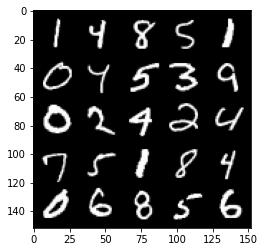

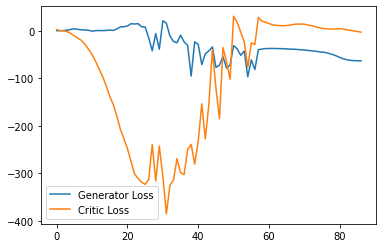

Step 1800: Generator loss: -63.853488006591796, critic loss: -4.9742137479782125


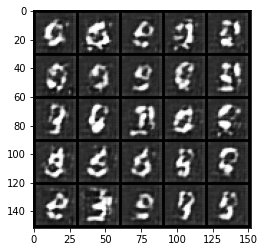

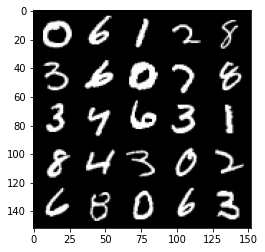

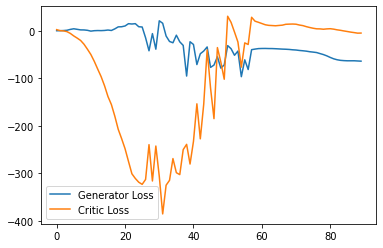

Step 1850: Generator loss: -65.59672386169433, critic loss: -5.844555236816407


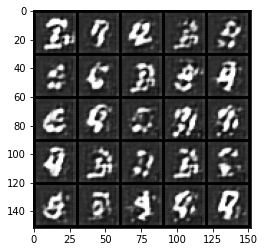

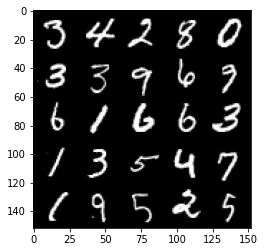

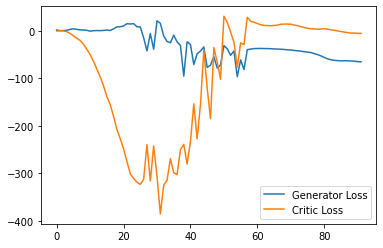

Step 1900: Generator loss: -67.29553901672364, critic loss: -7.045750766754152


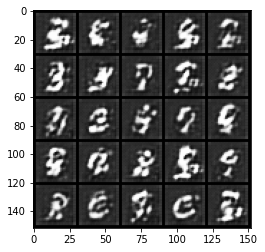

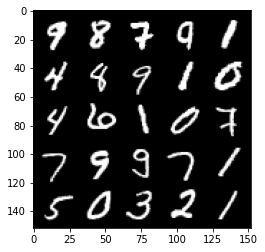

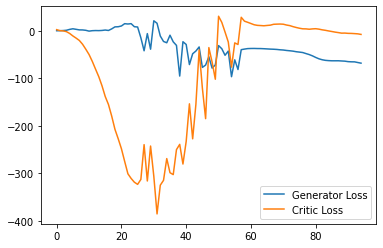

Step 1950: Generator loss: -66.181821975708, critic loss: -10.222402662277219


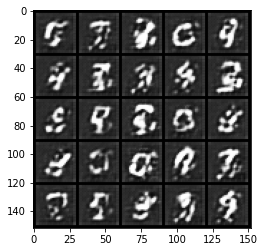

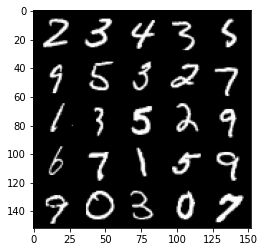

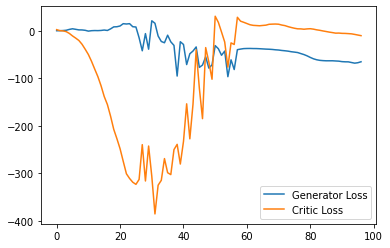

Step 2000: Generator loss: -65.94827796936035, critic loss: -16.35272526359558


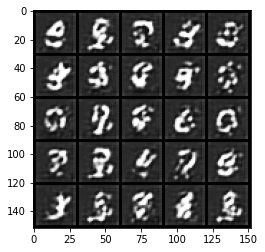

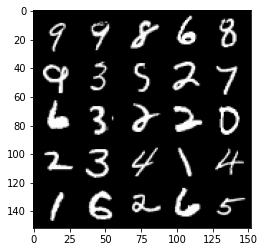

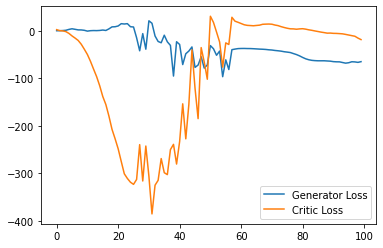

Step 2050: Generator loss: -63.035493774414064, critic loss: -22.442947265624998


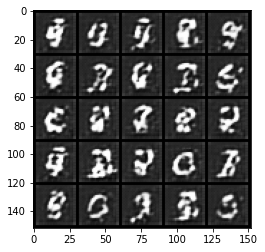

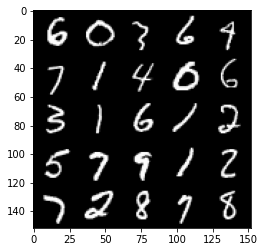

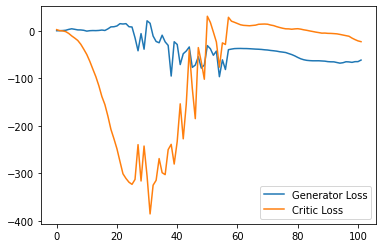

Step 2100: Generator loss: -62.33480735778809, critic loss: -23.52540931892396


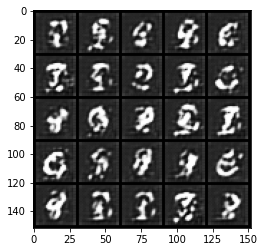

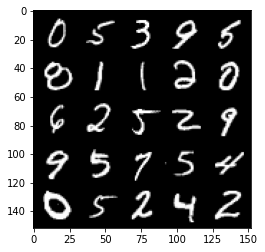

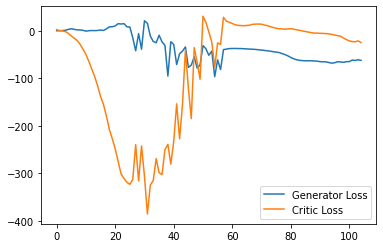

Step 2150: Generator loss: -59.593522491455076, critic loss: -26.085385562896732


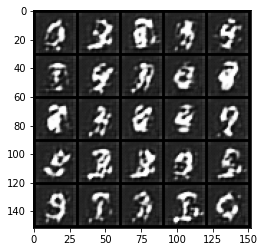

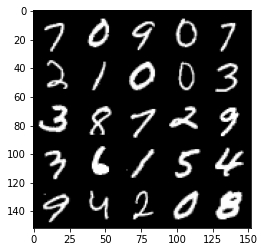

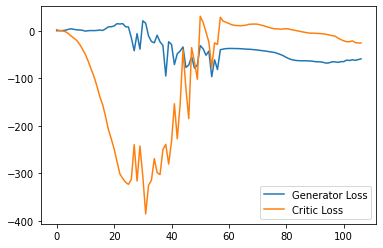

Step 2200: Generator loss: -61.66286010742188, critic loss: -27.07657121276855


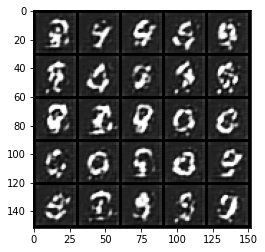

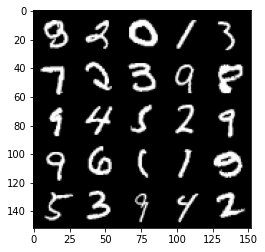

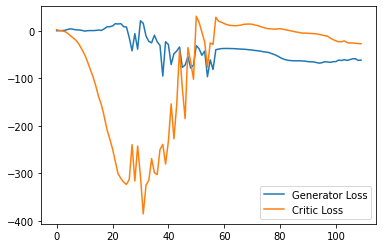

Step 2250: Generator loss: -57.40755500793457, critic loss: -26.496680763244623


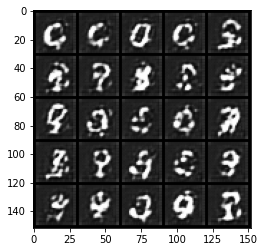

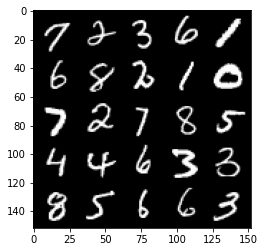

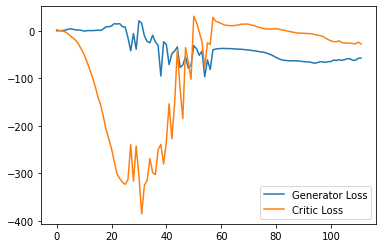

Step 2300: Generator loss: -55.94639045715332, critic loss: -20.789716682434086


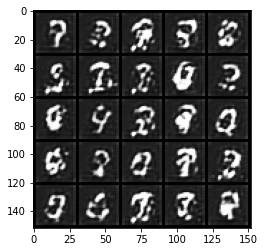

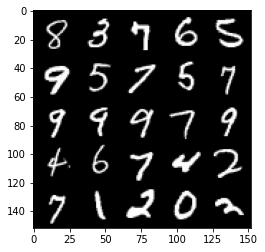

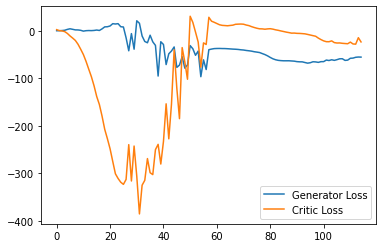

Step 2350: Generator loss: -54.566879196166994, critic loss: -23.449989757537843


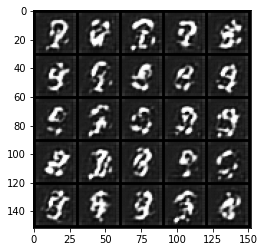

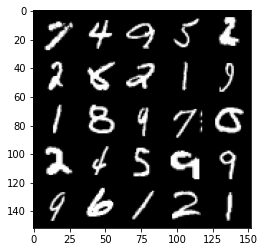

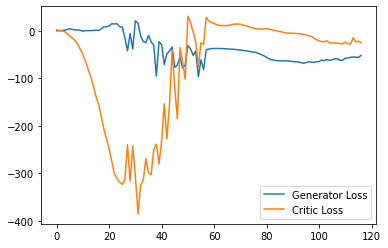

Step 2400: Generator loss: -54.34183410644531, critic loss: -25.647725372314444


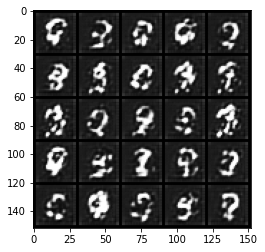

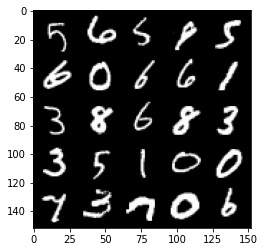

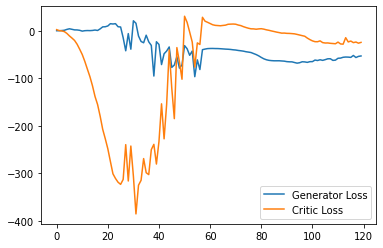

Step 2450: Generator loss: -55.12967742919922, critic loss: -23.713634393692008


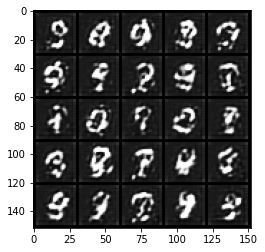

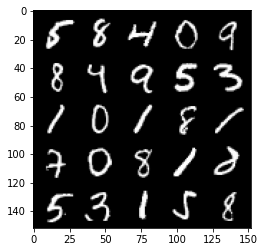

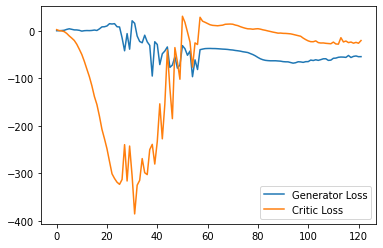

Step 2500: Generator loss: -52.46091468811035, critic loss: -14.534888775825499


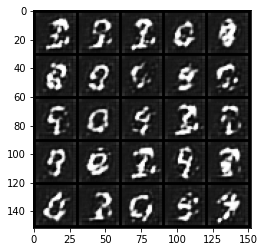

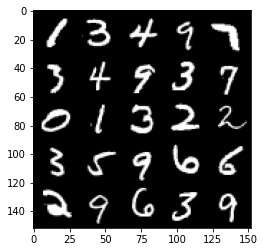

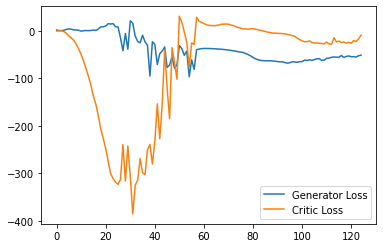

Step 2550: Generator loss: -52.421786346435546, critic loss: -17.31543990707398


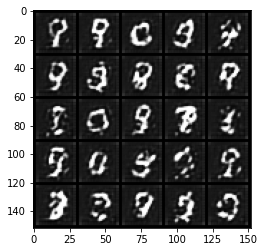

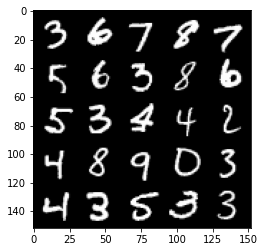

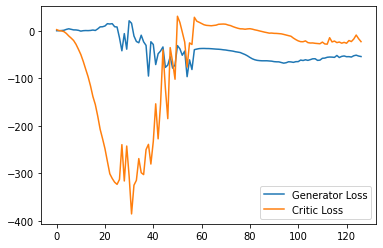

Step 2600: Generator loss: -48.19137725830078, critic loss: -3.1430986027717593


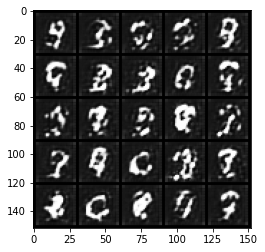

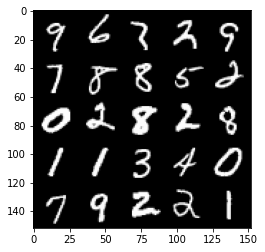

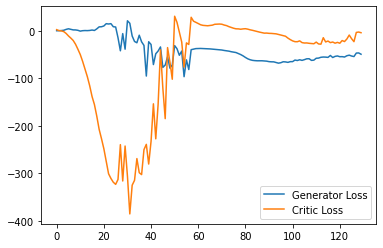

Step 2650: Generator loss: -53.24413558959961, critic loss: -11.256679139614105


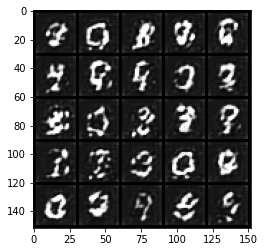

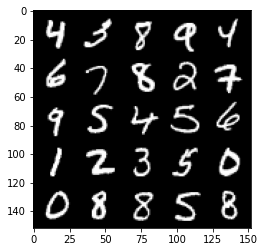

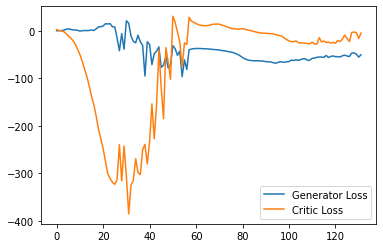

Step 2700: Generator loss: -50.3766081237793, critic loss: -10.566998839378359


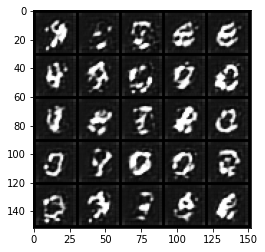

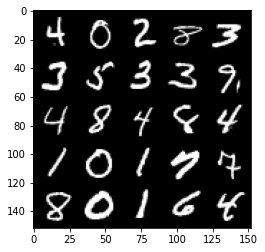

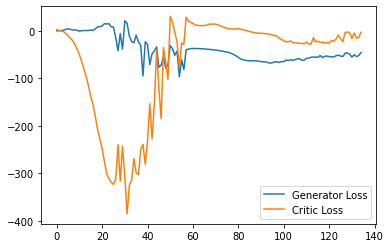

Step 2750: Generator loss: -50.77188179016113, critic loss: -7.334384236335755


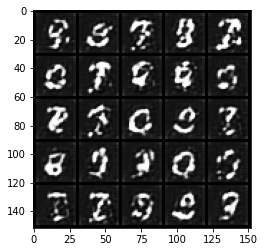

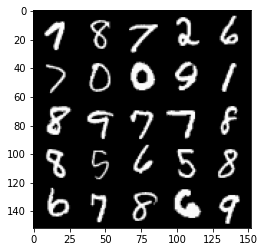

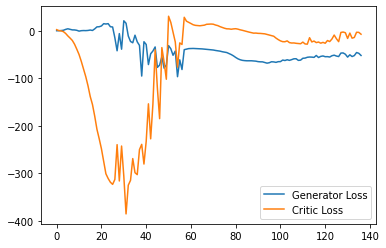

Step 2800: Generator loss: -51.686159973144534, critic loss: -17.52127436351776


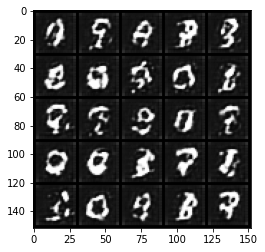

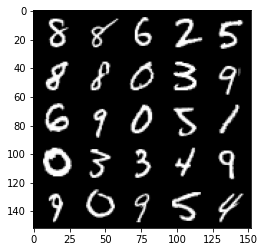

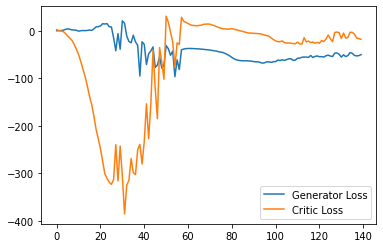

Step 2850: Generator loss: -49.516001815795896, critic loss: -17.697008462905885


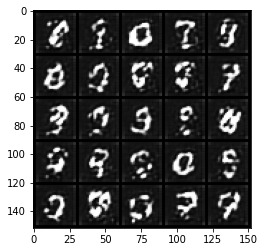

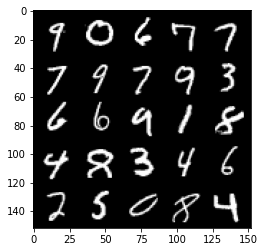

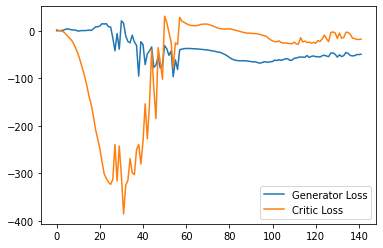

Step 2900: Generator loss: -45.189267578125, critic loss: -11.207616077423097


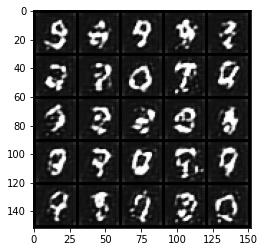

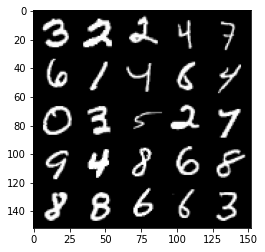

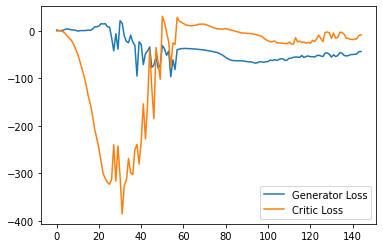

Step 2950: Generator loss: -45.90150188446045, critic loss: -12.74084546613693


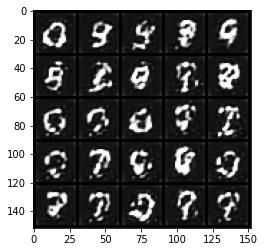

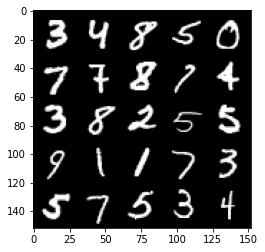

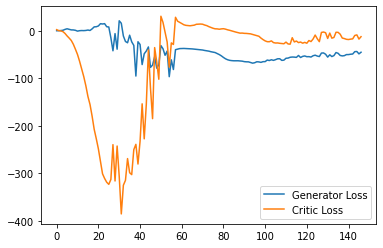

Step 3000: Generator loss: -43.83773788452149, critic loss: -11.925355548858647


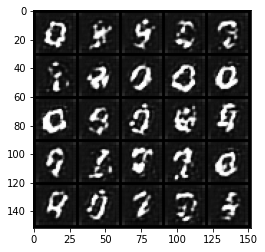

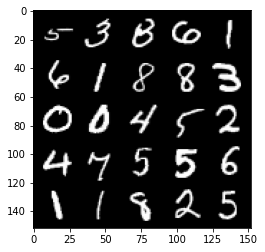

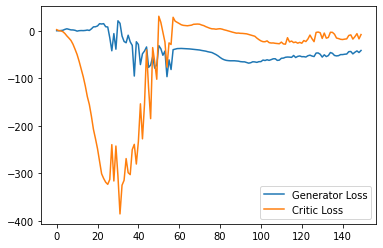

Step 3050: Generator loss: -42.93260360717773, critic loss: -10.970798493385313


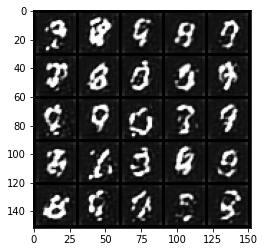

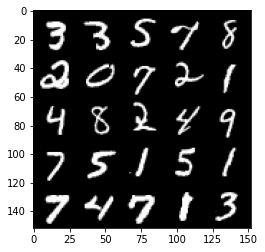

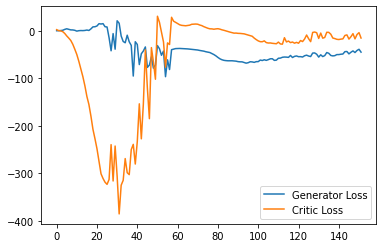

Step 3100: Generator loss: -45.5280029296875, critic loss: -14.494336565017704


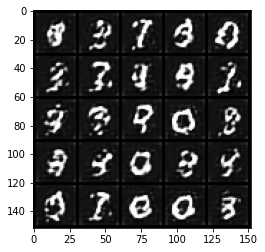

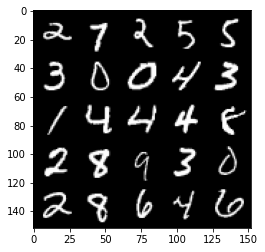

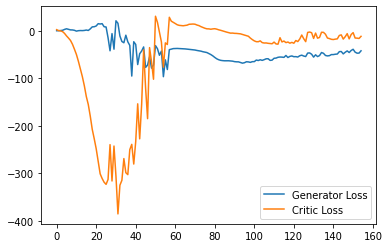

Step 3150: Generator loss: -39.146304321289065, critic loss: -8.150130942344665


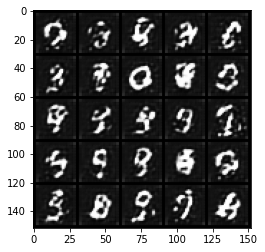

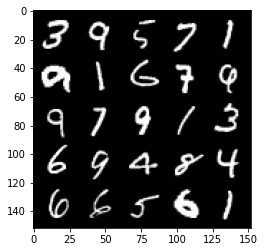

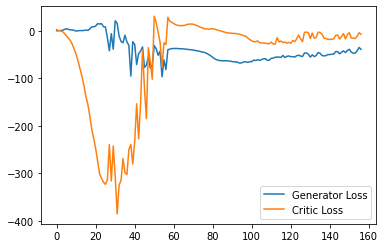

Step 3200: Generator loss: -44.89206790924072, critic loss: -18.64521433258057


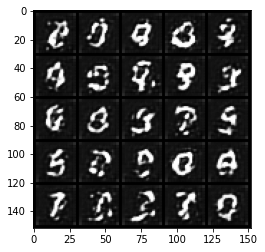

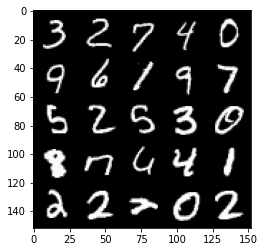

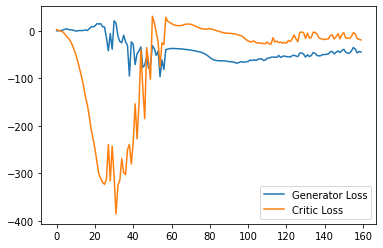

Step 3250: Generator loss: -40.29773658752441, critic loss: -11.248020123481753


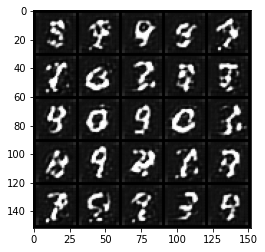

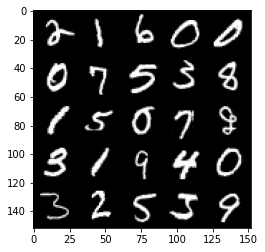

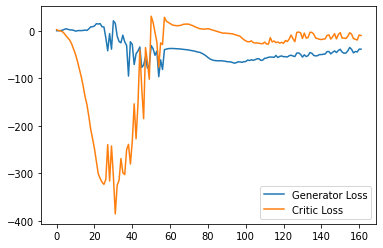

Step 3300: Generator loss: -43.122679252624515, critic loss: -19.53052618789673


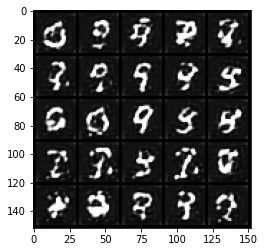

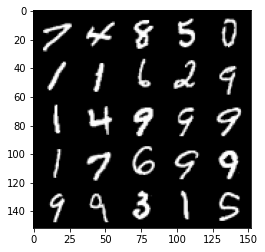

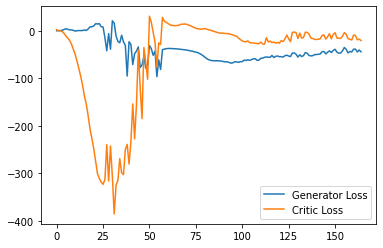

Step 3350: Generator loss: -37.371338806152345, critic loss: -4.708749267578126


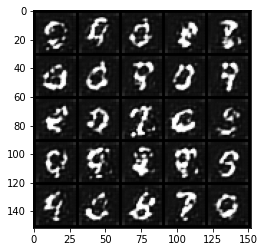

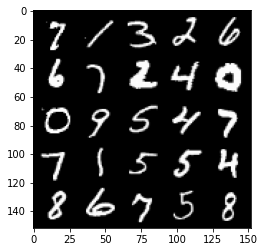

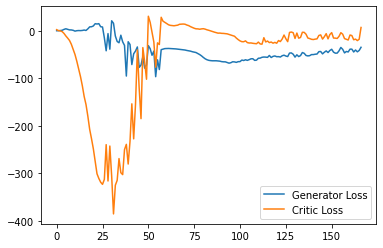

Step 3400: Generator loss: -38.12758728027344, critic loss: -2.5734423885345468


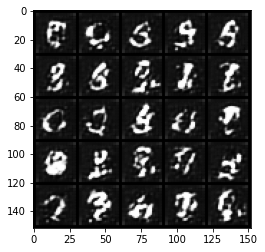

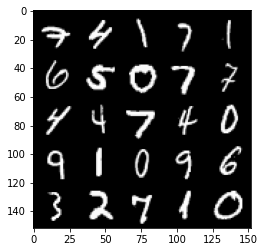

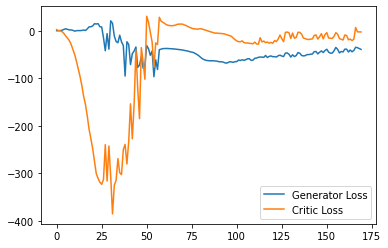

Step 3450: Generator loss: -41.702328033447266, critic loss: -3.279656443595887


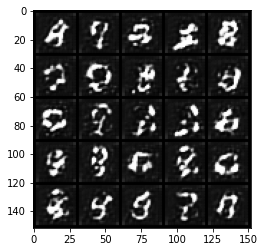

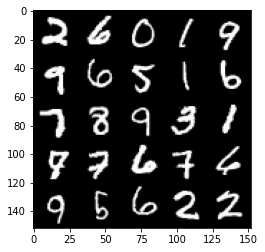

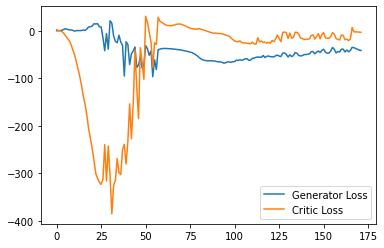

Step 3500: Generator loss: -43.64847991943359, critic loss: -4.8256101856231695


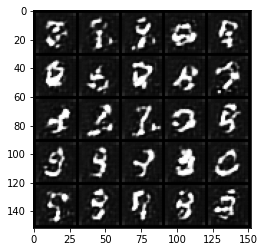

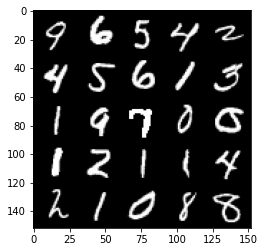

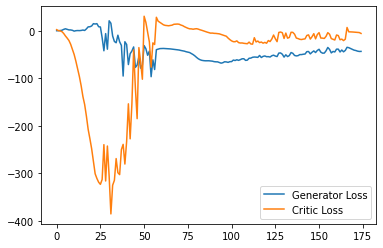

Step 3550: Generator loss: -45.94816013336182, critic loss: -17.087589156150816


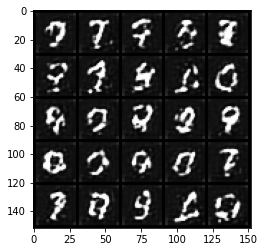

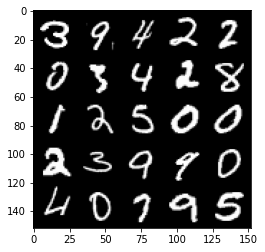

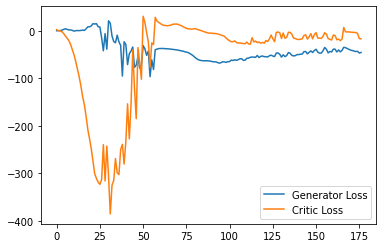

Step 3600: Generator loss: -42.34153518676758, critic loss: -11.933389259338377


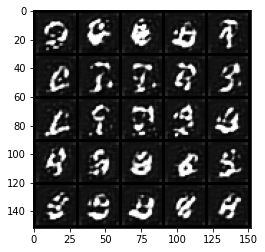

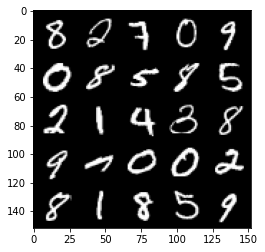

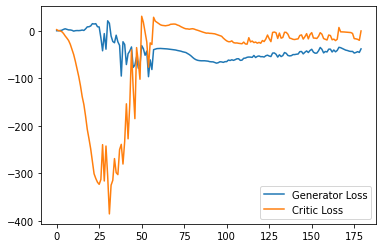

Step 3650: Generator loss: -34.38228706359863, critic loss: -3.519356294631959


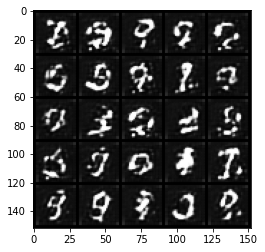

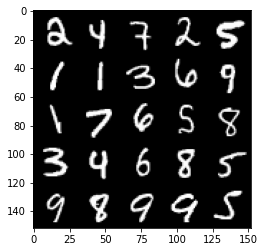

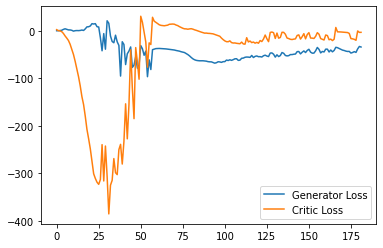

Step 3700: Generator loss: -39.862631454467774, critic loss: -4.864679623603822


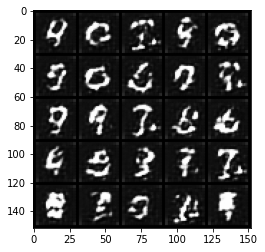

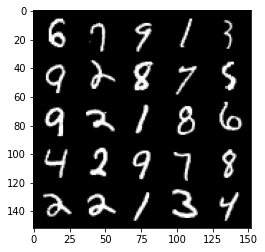

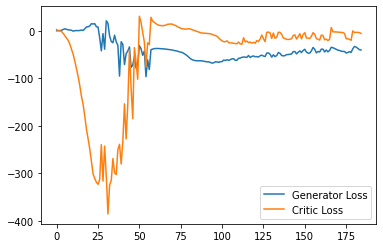

Step 3750: Generator loss: -43.45899223327637, critic loss: -15.757008520126346


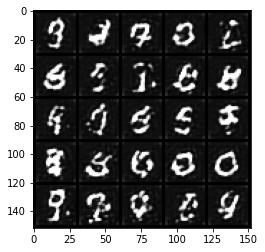

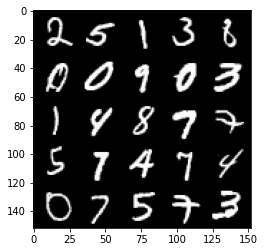

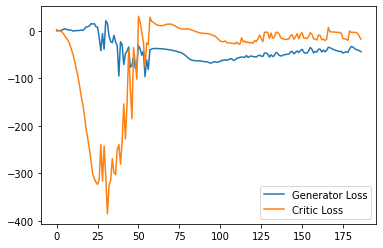

Step 3800: Generator loss: -41.03874885559082, critic loss: -16.730290815830227


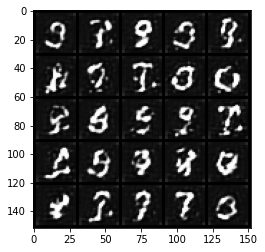

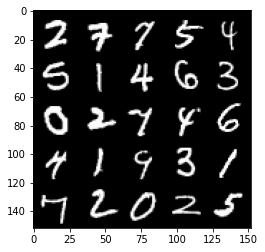

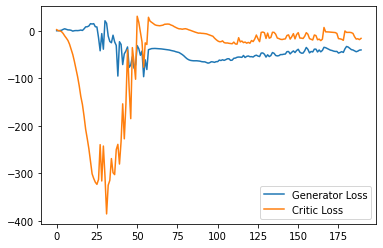

Step 3850: Generator loss: -38.27596576690674, critic loss: -14.158935422897342


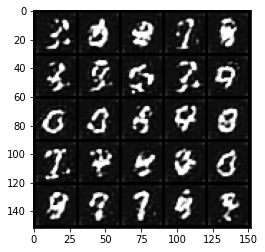

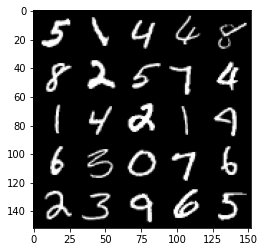

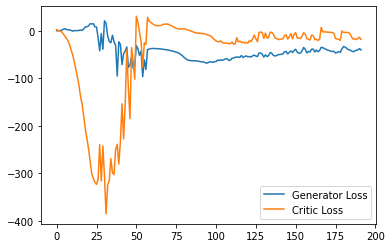

Step 3900: Generator loss: -37.35102840423584, critic loss: -15.391553658485414


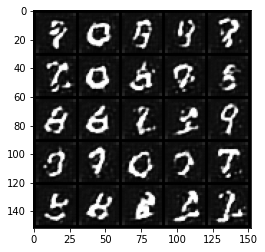

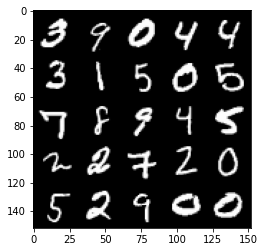

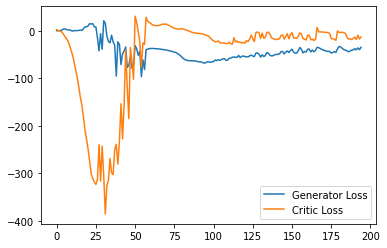

Step 3950: Generator loss: -35.73170732498169, critic loss: -12.992554319381716


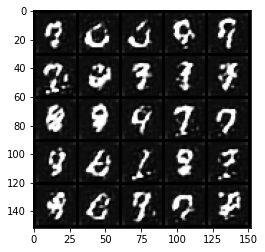

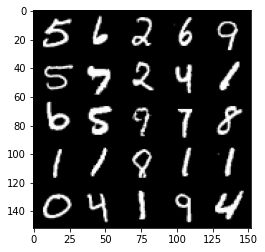

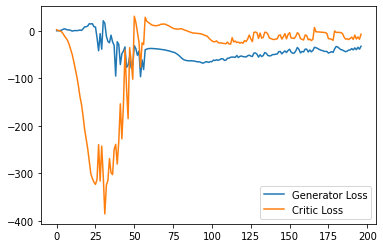

Step 4000: Generator loss: -34.159517478942874, critic loss: -6.678208874225615


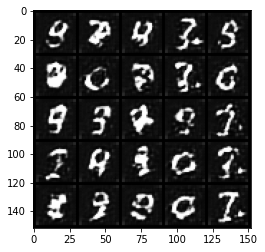

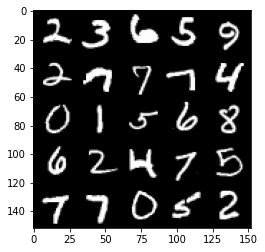

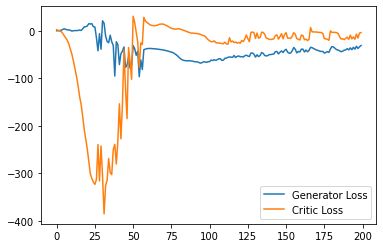

Step 4050: Generator loss: -41.1853226852417, critic loss: -14.797641578674313


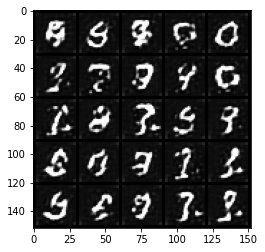

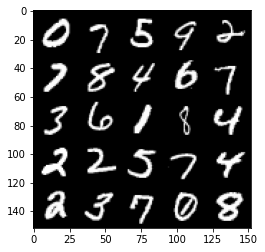

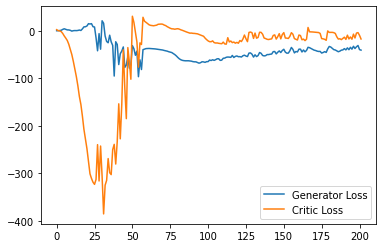

Step 4100: Generator loss: -39.38983047485352, critic loss: -16.223333156585696


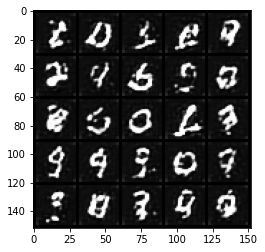

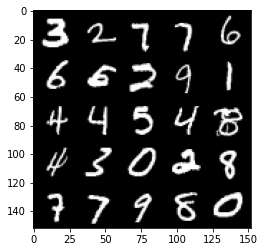

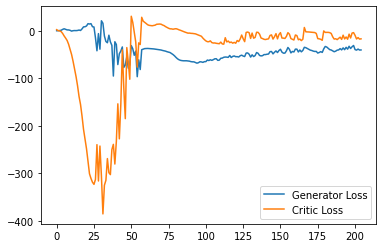

Step 4150: Generator loss: -38.87474311828613, critic loss: -15.504667490005493


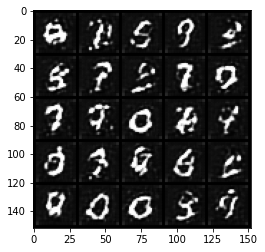

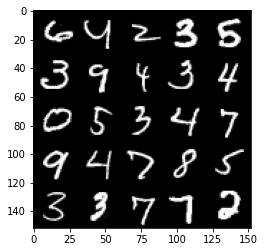

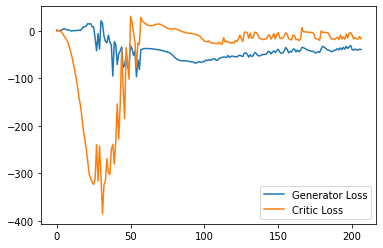

Step 4200: Generator loss: -31.97717456817627, critic loss: 1.563551565170288


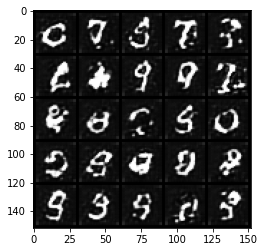

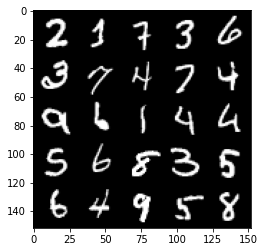

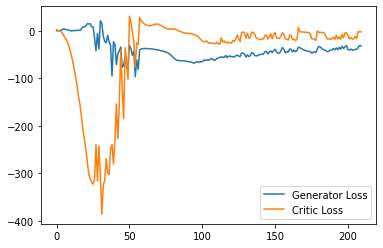

Step 4250: Generator loss: -35.348345565795896, critic loss: -2.474389850616455


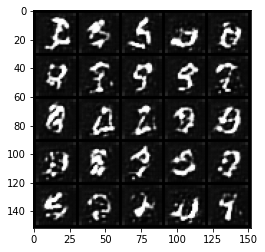

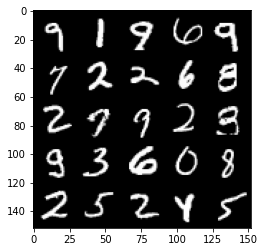

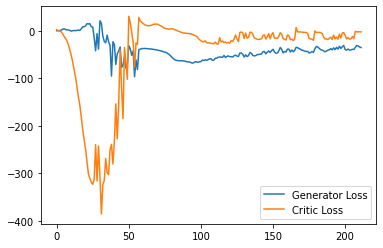

Step 4300: Generator loss: -36.95345443725586, critic loss: -2.904194360733033


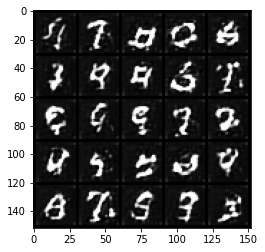

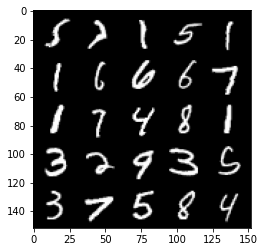

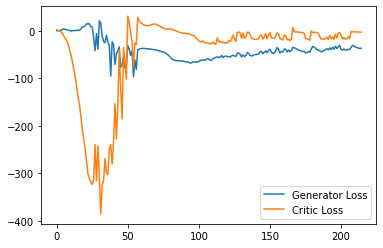

Step 4350: Generator loss: -38.864453353881835, critic loss: -2.9643714370727547


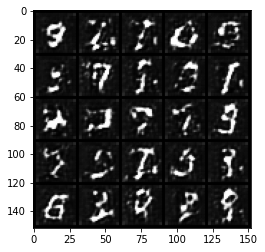

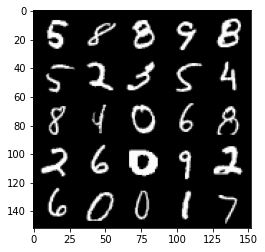

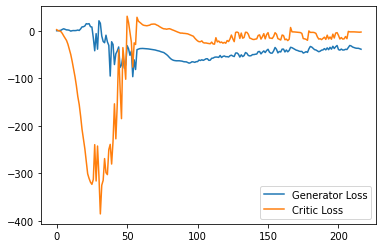

Step 4400: Generator loss: -40.59554641723633, critic loss: -4.637578595161438


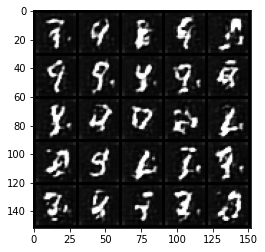

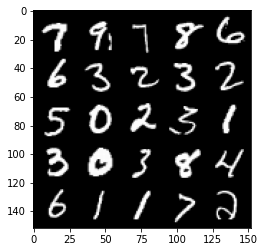

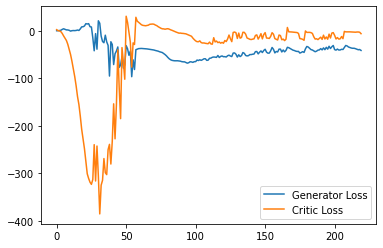

Step 4450: Generator loss: -44.0519896697998, critic loss: -14.423908949851992


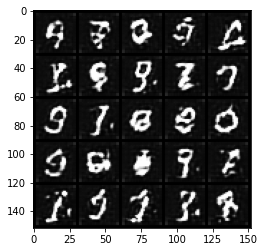

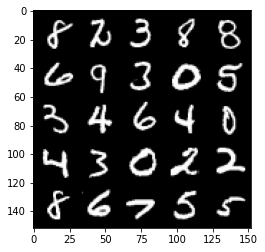

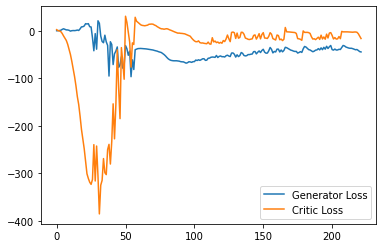

Step 4500: Generator loss: -37.28979904174805, critic loss: -5.847367965698245


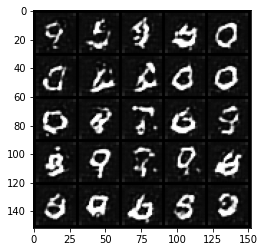

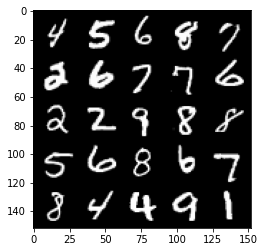

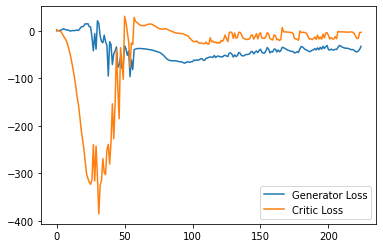

Step 4550: Generator loss: -35.29713302612305, critic loss: -4.3063164234161375


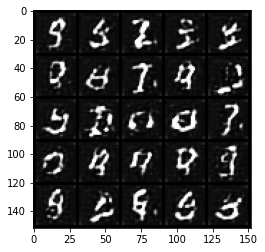

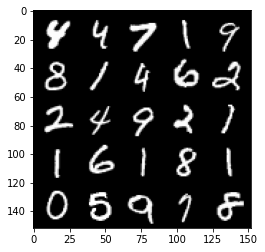

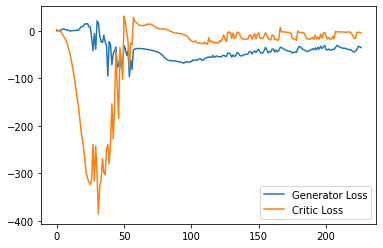

Step 4600: Generator loss: -41.197504692077636, critic loss: -14.272475295066835


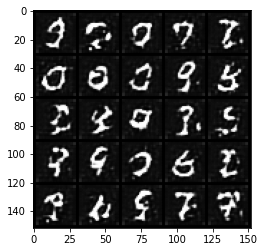

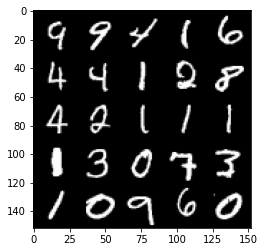

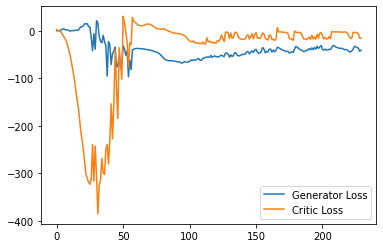

Step 4650: Generator loss: -41.10272212982178, critic loss: -15.244254493236538


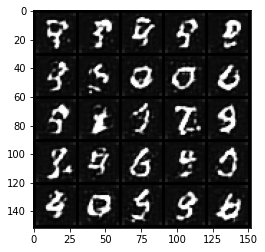

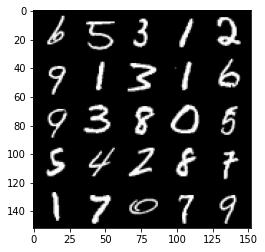

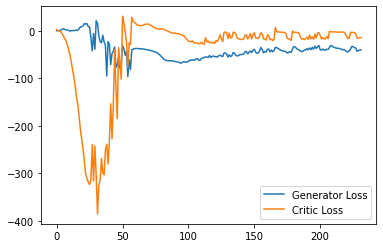

Step 4700: Generator loss: -40.372912635803225, critic loss: -16.52174214458466


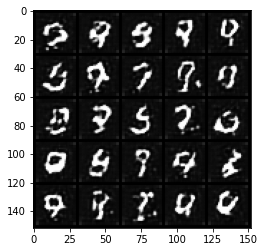

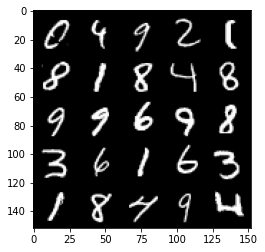

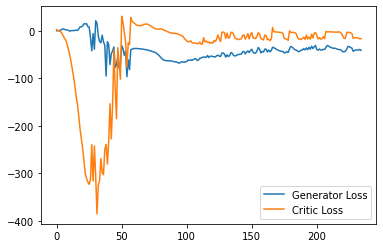

Step 4750: Generator loss: -36.60918926239014, critic loss: -12.922861782073976


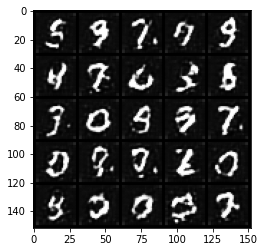

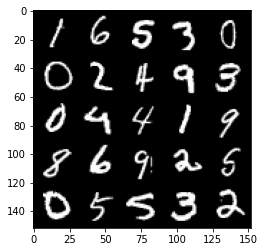

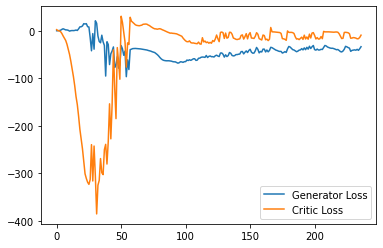

Step 4800: Generator loss: -37.68878913879394, critic loss: -14.673820675849916


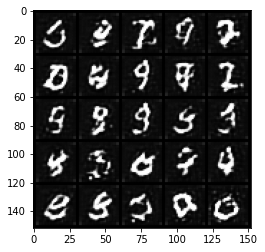

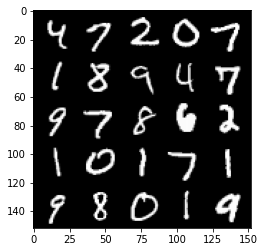

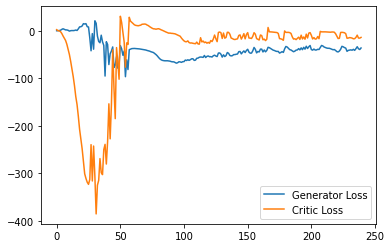

Step 4850: Generator loss: -30.116609039306642, critic loss: -5.52893493270874


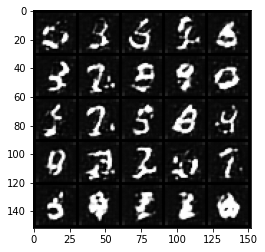

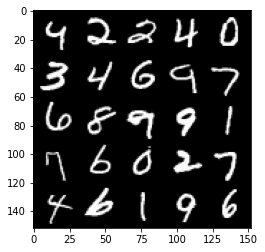

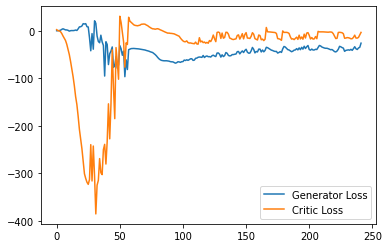

Step 4900: Generator loss: -37.25007984161377, critic loss: -7.015657423019409


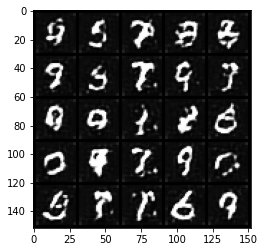

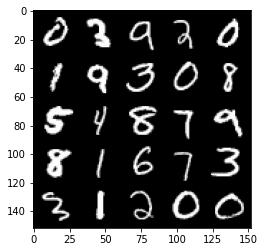

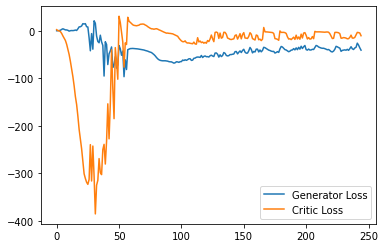

Step 4950: Generator loss: -37.24494976043701, critic loss: -13.223705486297604


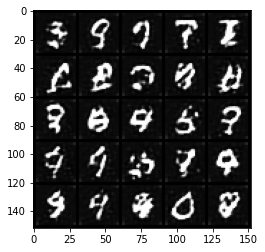

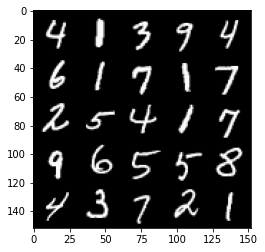

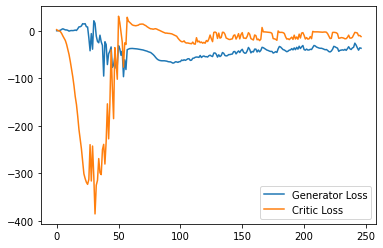

Step 5000: Generator loss: -37.37139335632324, critic loss: -16.421563825130466


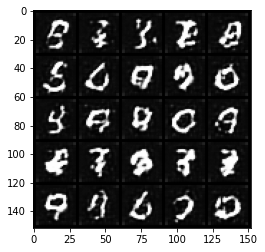

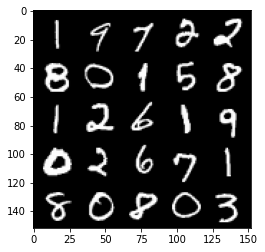

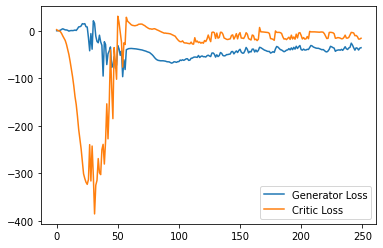

Step 5050: Generator loss: -37.35372043609619, critic loss: -12.976548470497134


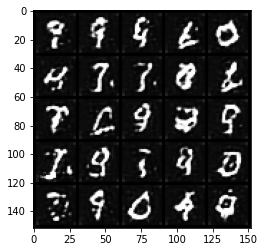

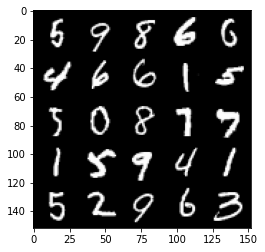

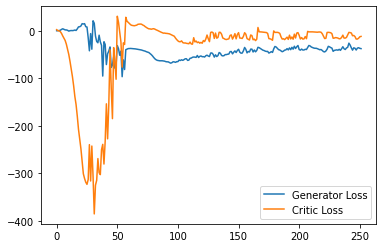

Step 5100: Generator loss: -35.961288604736325, critic loss: -2.6556653680801348


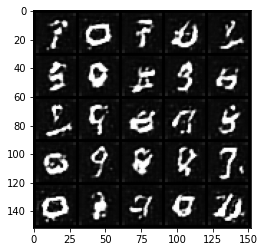

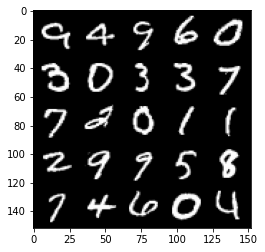

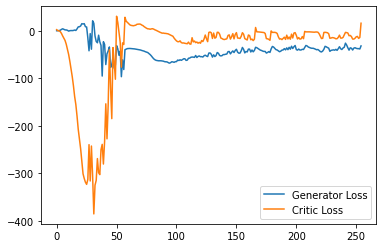

Step 5150: Generator loss: -33.339515113830565, critic loss: -0.08853458356857302


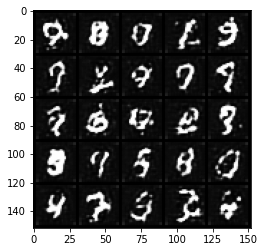

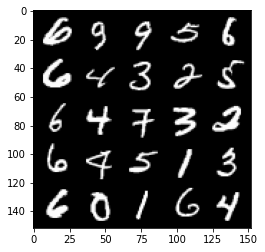

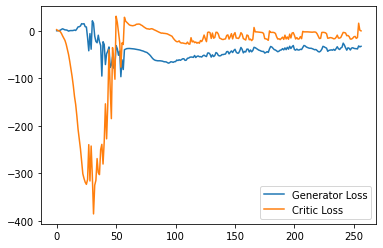

Step 5200: Generator loss: -33.081185531616214, critic loss: -1.5683424985408783


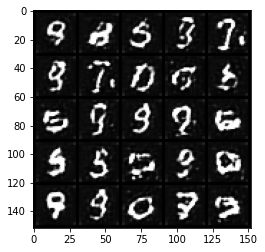

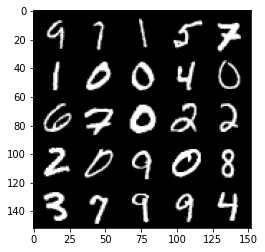

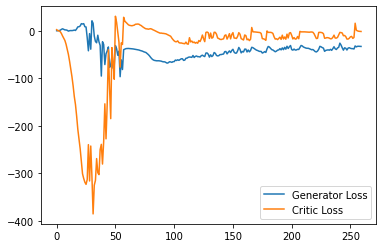

Step 5250: Generator loss: -33.2269637298584, critic loss: -1.8503981237411502


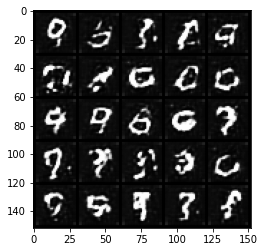

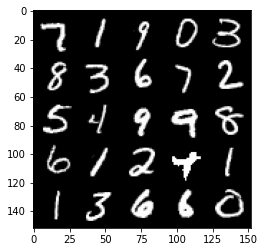

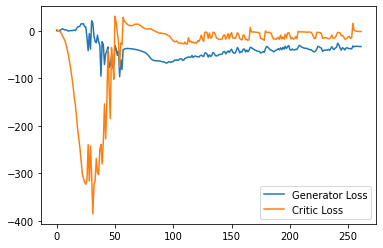

Step 5300: Generator loss: -32.42393306732178, critic loss: -2.1427005910873422


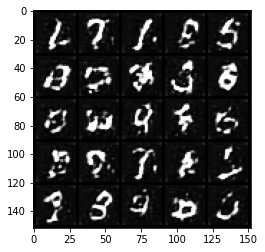

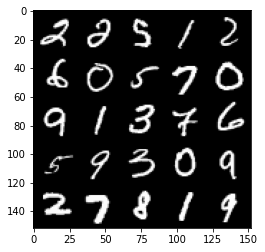

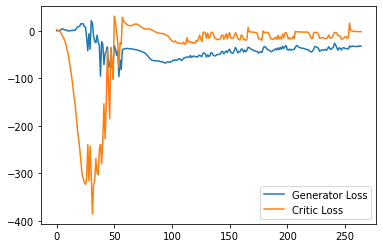

Step 5350: Generator loss: -33.01255836486816, critic loss: -2.3213641605377195


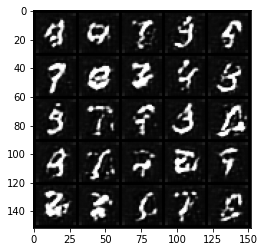

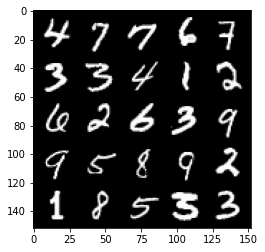

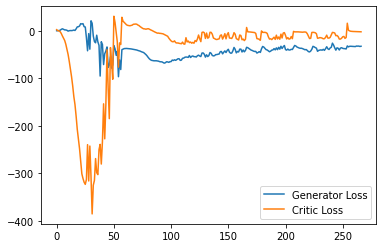

Step 5400: Generator loss: -33.55550369262696, critic loss: -2.45617435836792


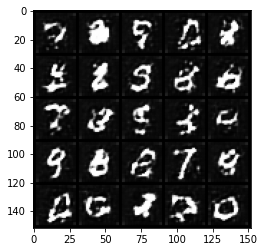

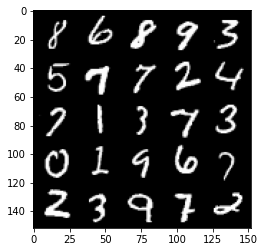

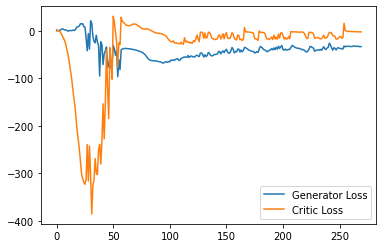

Step 5450: Generator loss: -33.949298782348635, critic loss: -2.5898649606704707


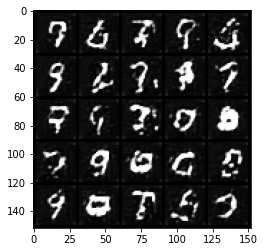

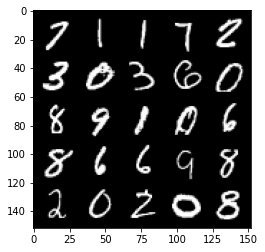

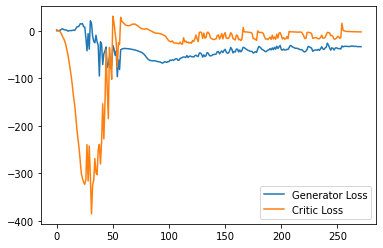

Step 5500: Generator loss: -34.48644630432129, critic loss: -2.9435647382736203


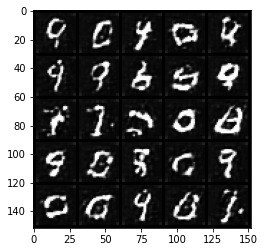

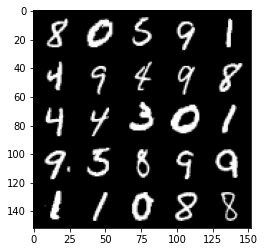

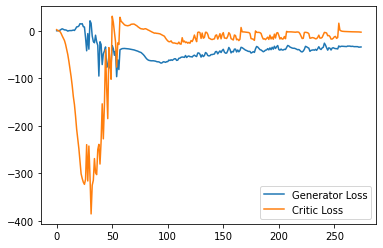

Step 5550: Generator loss: -34.32985877990723, critic loss: -3.37892139339447


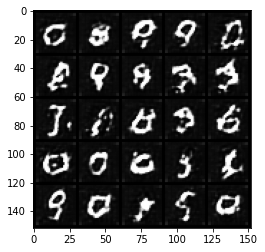

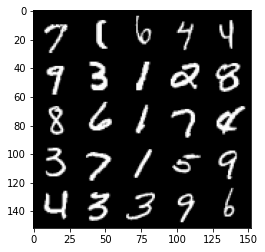

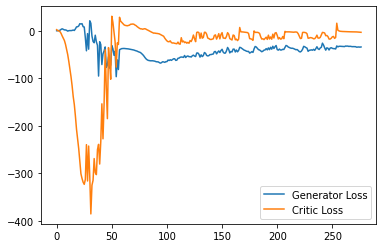

Step 5600: Generator loss: -33.88571357727051, critic loss: -3.609531055927276


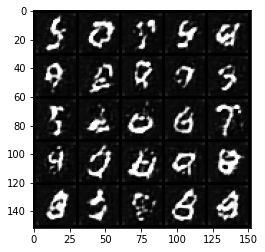

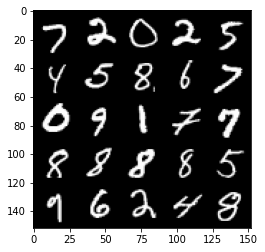

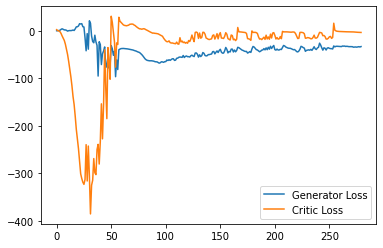

Step 5650: Generator loss: -33.98632164001465, critic loss: -3.776553945302963


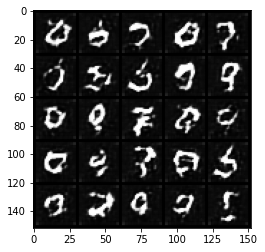

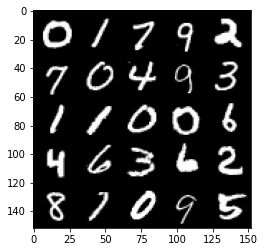

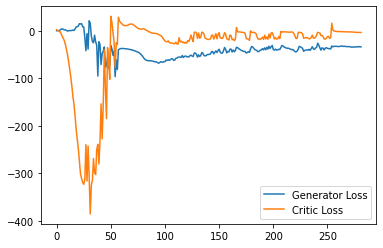

Step 5700: Generator loss: -33.070062713623045, critic loss: -4.470798572540283


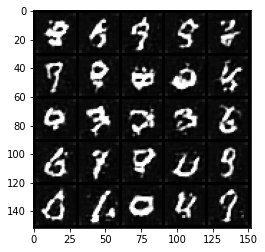

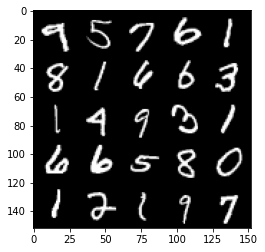

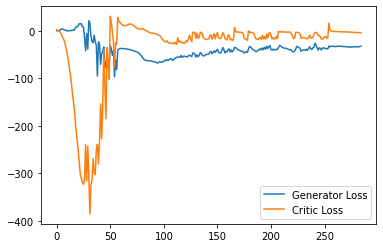

KeyboardInterrupt: 

In [54]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)            
            
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
